<a href="https://colab.research.google.com/github/kohi2112002/WineQuality/blob/FINAL/WineQuality_LR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Clone **DATA**


In [ ]:
import pandas as pd
import numpy as np
import pymongo
import matplotlib.pyplot as plt
import seaborn as sns
import math
from statistics import mean
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score
from sklearn import datasets, metrics, model_selection, svm

In [ ]:
!git clone https://github.com/kohi2112002/WineQuality.git

Cloning into 'WineQuality'...
remote: Enumerating objects: 56, done.
remote: Counting objects: 100% (56/56), done.
remote: Compressing objects: 100% (55/55), done.
remote: Total 56 (delta 28), reused 6 (delta 0), pack-reused 0
Unpacking objects: 100% (56/56), done.


In [ ]:
# upload file to drive
red_path = '/content/WineQuality/winequality-red.csv'
white_path = '/content/WineQuality/winequality-white.csv'

In [ ]:
# read file into dataframe
red_df = pd.read_csv(red_path)
white_df = pd.read_csv(white_path)
full = pd.concat([red_df, white_df])

In [ ]:
# check 
print(red_df.shape)
print(white_df.shape)

(1599, 12)
(4898, 12)


# **Check data**

Text(0.5, 1.0, 'Correlation between variables')

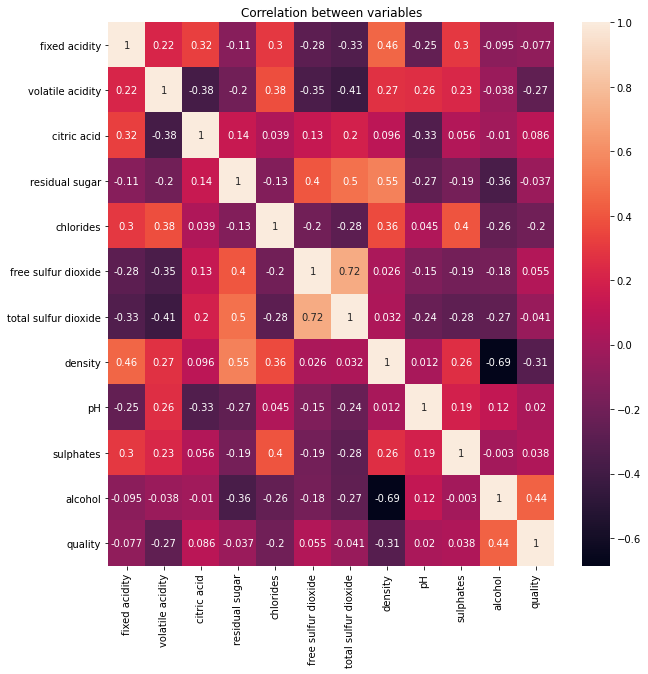

In [ ]:
#Check correlation
corr = full.corr()
fig, ax = plt.subplots(figsize = (10,10))
g= sns.heatmap(corr,ax=ax, annot= True)
ax.set_title('Correlation between variables')

In [ ]:
corr_vec = full.corr()['quality']
print(abs(corr_vec) > 0.05)
print((abs(corr_vec)).idxmin())

fixed acidity            True
volatile acidity         True
citric acid              True
residual sugar          False
chlorides                True
free sulfur dioxide      True
total sulfur dioxide    False
density                  True
pH                      False
sulphates               False
alcohol                  True
quality                  True
Name: quality, dtype: bool
pH


In [ ]:
#Remove not needed data
# opt_data = full.drop(['residual sugar','pH','sulphates','total sulfur dioxide'], axis = 1)
opt_data = full

In [ ]:
#This function calculate the 
def re_cm(cnf_matrix):
  FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)  
  FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
  TP = np.diag(cnf_matrix)
  TN = cnf_matrix.sum() - (FP + FN + TP)

  FP = FP.astype(float)
  FN = FN.astype(float)
  TP = TP.astype(float)
  TN = TN.astype(float)

  # Sensitivity, hit rate, recall, or true positive rate
  TPR = TP/(TP+FN)
  # Specificity or true negative rate
  TNR = TN/(TN+FP) 
  # Precision or positive predictive value
  PPV = TP/(TP+FP)
  # Negative predictive value
  NPV = TN/(TN+FN)
  # Fall out or false positive rate
  FPR = FP/(FP+TN)
  # False negative rate
  FNR = FN/(TP+FN)
  # False discovery rate
  FDR = FP/(TP+FP)
  # Overall accuracy
  ACC = (TP+TN)/(TP+FP+FN+TN)
  
  TPR[np.isnan(TPR)] = mean(TPR[np.logical_not(np.isnan(TPR))])
  FNR[np.isnan(FNR)] = mean(FNR[np.logical_not(np.isnan(FNR))])
  PPV[np.isnan(PPV)] = mean(PPV[np.logical_not(np.isnan(PPV))])

  return [ACC, TPR, FPR, FNR, PPV]

In [ ]:
#Scale data with MinMax Scaler
scaler = MinMaxScaler()

#this function return scaled data
def Khoi_Scaler(data):
  scaler.fit(data)
  return scaler.transform(data)

In [ ]:
#Scale data with Robust Scaler
transform = RobustScaler()

#this funtion return scaled data
def Khoi_Robust(data):
  return transform.fit_transform(data)

In [ ]:
#Scale data with Standard Scaler
khoi_scaler = StandardScaler()

#this function return data scaled by Standard Scaler
def Khoi_SD_Scaler(data):
  return khoi_scaler.fit_transform(data)

In [ ]:
#this function return Standard Deviation
def KHOI_standard_deviation(y_true, y_pred):
  if(len(y_true) != len(y_pred)):
    print("Error")
  N = len(y_true)
  mean_y_true = np.mean(y_true, dtype=np.float64)
  mean_array = np.array([mean_y_true for i in range(N)])
  distance = (y_pred - mean_array)
  sum_dis = distance @ distance.T
  mean_sum_dis = sum_dis/N
  return math.sqrt(mean_sum_dis)

In [ ]:
#This function return accuracy rate
def KHOI_Accuracy(y_true, y_pred):
		m = np.size(y_true)
		error = y_pred - y_true 
		return (1/(2*m)) * (np.transpose(error)@error)

In [ ]:
#This function print the linear regression equation 
def Khoi_LE(para):
  return ('Y = {}X'.format(para))

In [ ]:
#Data partition

#This is function return train and target data set
def needed_data(data, target_label, index):
  #Scale data
  data = Khoi_Robust(data)
  # data = Khoi_SD_Scaler(data)
  # data = Khoi_Scaler(data)
  #split data
  X_train_full1, X_test_full1,Y_train_full1,Y_test_full1 = train_test_split(np.delete(data, index, axis = 1),data[:,index], test_size = 0.1, random_state = 100)
  X_train_full2, X_test_full2,Y_train_full2, Y_test_full2 = train_test_split(np.delete(data, index, axis = 1),data[:,index], test_size = 0.1, random_state = 220)
  X_train_full3, X_test_full3,Y_train_full3,Y_test_full3 = train_test_split(np.delete(data, index, axis = 1),data[:,index], test_size = 0.1, random_state = 343)
  #store data
  X_train_full = [X_train_full1, X_train_full2, X_train_full3]
  X_test_full = [X_test_full1, X_test_full2, X_test_full3]
  Y_train_full = [Y_train_full1, Y_train_full2, Y_train_full3]
  Y_test_full = [Y_test_full1, Y_test_full2, Y_test_full3]  
  #return data
  return [X_train_full, X_test_full, Y_train_full, Y_test_full]

In [ ]:
#This function plot comparision
def Khoi_Plot(y_true, y_pred, _in, label):
  plt.figure(figsize=(50,5))
  plt.figure(_in)
  plt.title(label, fontsize='xx-large')
  plt.plot(y_true, color='green')
  plt.plot(y_pred, color='red')

In [ ]:
#This function plot ROC curve
def Khoi_ROC(TP, FP, index, label):
  plt.figure(figsize=(100,50))
  plt.subplot(12,3, index + 1)
  plt.title(label)  
  sns.lineplot(x=FP, y=TP)

# **Linear Regresstion for Red Wine**

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide




The Linear Regression Equation of fixed acidity in 0th test: 
Y = [ 0.04042776  0.31387758 -0.08202747 -0.03521304  0.06944655 -0.12871171
  0.6893785  -0.47466426 -0.06238626  0.40569086  0.01252406]X
The RMSE of fixed acidity in 0th test: 0.3018713403481303
The SD of fixed acidity in 0th test: 0.7582990778513935
The Confusion matrix of fixed acidity in 0th test: 
[[  0   0   0   0   0]
 [  1   4   0   0   0]
 [  0   3 125   0   0]
 [  0   0   6  14   0]
 [  0   0   0   4   3]]
The Accuracy is: 0.9650000000000001 
The True positive rate is: 0.726283482142857 
The False Positive Rate is: 0.0483352534562212 
The False Negative Rate is:0.27371651785714285 
The Precision is 0.6606809644977584

The Mean Performance of fixed acidity in 0th test: 0.42725405448849485




The Linear Regression Equation of fixed acidity in 1th test: 
Y = [ 0.04100345  0.30833224 -0.08216298 -0.03609982  0.06596818 -0.13085003
  0.69783669 -0.48270171 -0.05557891  0.408697    0.01416939]X
The RMSE of fixed aci

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide




The Linear Regression Equation of volatile acidity in 0th test: 
Y = [ 0.12711579 -0.82274236 -0.00413629  0.06360727 -0.1427987   0.17376611
  0.16032392  0.03119311 -0.10460088  0.16634245 -0.18096328]X
The RMSE of volatile acidity in 0th test: 0.48388018868201355
The SD of volatile acidity in 0th test: 0.49420337277692117
The Confusion matrix of volatile acidity in 0th test: 
[[  0  14   0   0]
 [  1 133   0   0]
 [  0  10   1   0]
 [  0   1   0   0]]
The Accuracy is: 0.91875 
The True positive rate is: 0.2708616010854817 
The False Positive Rate is: 0.24209694415173869 
The False Negative Rate is:0.7291383989145183 
The Precision is 0.6139240506329114

The Mean Performance of volatile acidity in 0th test: 0.4640052486961625




The Linear Regression Equation of volatile acidity in 1th test: 
Y = [ 0.12029852 -0.86283146 -0.00302601  0.06200611 -0.13611818  0.15360603
  0.17489183  0.01692172 -0.11715655  0.18660119 -0.19276675]X
The RMSE of volatile acidity in 1th test: 0.6048787

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide




The Linear Regression Equation of citric acid in 1th test: 
Y = [ 0.36105185 -0.34437901  0.01149146  0.04337166 -0.09852431  0.14571105
  0.0106525  -0.03700092  0.01451039  0.14856963 -0.02675023]X
The RMSE of citric acid in 1th test: 0.4095429264441888
The SD of citric acid in 1th test: 0.4649960035152912
The Confusion matrix of citric acid in 1th test: 
[[  0   0   0]
 [  0 145   2]
 [  1   9   3]]
The Accuracy is: 0.9500000000000001 
The True positive rate is: 0.60858189429618 
The False Positive Rate is: 0.23738771149485435 
The False Negative Rate is:0.39141810570382 
The Precision is 0.5138528138528139

The Mean Performance of citric acid in 1th test: 0.4378101313369171




The Linear Regression Equation of citric acid in 2th test: 
Y = [ 0.37229953 -0.33946876  0.0116184   0.04666772 -0.09808805  0.16185355
  0.00511901 -0.02585672  0.0134346   0.13808889 -0.01141387]X
The RMSE of citric acid in 2th test: 0.34575639795806373
The SD of citric acid in 2th test: 0.4851660723759

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value



The Linear Regression Equation of residual sugar in 0th test: 
Y = [-2.30701008e+00 -3.69982938e-02  2.95459374e-01 -2.59345375e-03
  4.24603518e-01  1.02687536e-01  2.80140699e+00 -1.15187022e+00
 -4.28283896e-01  1.99872805e+00  1.04071892e-01]X
The RMSE of residual sugar in 0th test: 1.2307688927284215
The SD of residual sugar in 0th test: 1.166676338391156
The Confusion matrix of residual sugar in 0th test: 
[[ 0  0  0  0  0  0  0  0  0]
 [ 2  1  7  0  0  0  0  0  0]
 [ 0 11 79 28  7  1  0  0  0]
 [ 0  0  4  3  4  0  0  0  0]
 [ 0  0  5  1  0  1  0  0  0]
 [ 0  0  0  0  1  0  0  0  0]
 [ 0  0  0  0  1  1  0  0  0]
 [ 0  0  1  0  1  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0]]
The Accuracy is: 0.8930555555555555 
The True positive rate is: 0.12496392496392497 
The False Positive Rate is: 0.09970792733679236 
The False Negative Rate is:0.8750360750360751 
The Precision is 0.16666666666666666

The Mean Performance of residual sugar in 0th test: 0.31659364850086474




The Linear Regre

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This i



The Linear Regression Equation of residual sugar in 2th test: 
Y = [-2.20173729e+00 -8.22303977e-02  2.55739003e-01 -8.64795444e-04
  3.78349492e-01  1.02804798e-01  2.70221972e+00 -1.13432226e+00
 -4.18921588e-01  2.01995773e+00  4.20940922e-02]X
The RMSE of residual sugar in 2th test: 1.3959390318926437
The SD of residual sugar in 2th test: 1.2754748580846444
The Confusion matrix of residual sugar in 2th test: 
[[ 7  5  1  0  0  0  0  0  0  0  0]
 [14 84 22  3  1  0  0  0  0  0  0]
 [ 0  2  0  0  0  0  0  0  0  0  0]
 [ 0  4  1  3  0  0  0  0  0  0  0]
 [ 0  0  0  1  0  0  1  0  0  0  0]
 [ 0  0  1  5  0  0  0  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0  0  0]
 [ 0  0  0  1  0  0  0  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0  0  0]
 [ 0  0  0  0  1  0  0  0  0  0  0]]
The Accuracy is: 0.925 
The True positive rate is: 0.14462553575456802 
The False Positive Rate is: 0.06024962276140735 
The False Negative Rate is:0.855374464245432 
The Precision is 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 f



The Linear Regression Equation of chlorides in 1th test: 
Y = [-1.4764336   0.86437756  1.51483152 -0.00556637  0.22828471 -0.51670092
  0.51715952 -1.01028746  0.93782634 -0.33587622 -0.36025895]X
The RMSE of chlorides in 1th test: 1.9647418246770267
The SD of chlorides in 1th test: 1.8153752291632264
The Confusion matrix of chlorides in 1th test: 
[[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 1  0  0  2  1  0  0  0  0  0  0  0  0  0]
 [ 0  2  7  5  1  0  0  0  0  0  0  0  0  0]
 [ 0  3  8 76 12  5  1  2  0  0  0  0  0  0]
 [ 0  0  0 13  4  3  0  0  0  1  1  0  0  0]
 [ 0  0  1  0  0  2  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  1  1  0  0  0  0  0]
 [ 0  0  0  2  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  1  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  1  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  1  0  0]
 [ 0  0  0  0  0  0  0  0  0  1  0  1  0  0]]
The Accuracy is

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This i



The Linear Regression Equation of free sulfur dioxide in 0th test: 
Y = [ 0.22221289 -0.14531919 -0.25971207  0.04830722  0.01844356  0.63152901
 -0.1564403   0.17511433  0.0361537  -0.06184221  0.03481956]X
The RMSE of free sulfur dioxide in 0th test: 0.5456029916643307
The SD of free sulfur dioxide in 0th test: 0.49216543213302566
The Confusion matrix of free sulfur dioxide in 0th test: 
[[131   6   0   0]
 [ 16   2   1   0]
 [  2   1   0   0]
 [  0   1   0   0]]
The Accuracy is: 0.915625 
The True positive rate is: 0.2653668843641952 
The False Positive Rate is: 0.21142892776406214 
The False Negative Rate is:0.7346331156358048 
The Precision is 0.35973154362416104

The Mean Performance of free sulfur dioxide in 0th test: 0.3927901178470558




The Linear Regression Equation of free sulfur dioxide in 1th test: 
Y = [ 0.21024468 -0.14786546 -0.26815338  0.04655835  0.01778928  0.65844388
 -0.15249133  0.17497388  0.03890525 -0.06044741  0.04483994]X
The RMSE of free sulfur dioxide 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This i



The Linear Regression Equation of free sulfur dioxide in 2th test: 
Y = [ 0.19092879 -0.15774599 -0.25749974  0.04512356  0.02070251  0.63335884
 -0.12830109  0.17022502  0.02528003 -0.05360968  0.03992059]X
The RMSE of free sulfur dioxide in 2th test: 0.47754765451884673
The SD of free sulfur dioxide in 2th test: 0.526124097561234
The Confusion matrix of free sulfur dioxide in 2th test: 
[[132   5   0]
 [ 15   5   0]
 [  1   2   0]]
The Accuracy is: 0.9041666666666668 
The True positive rate is: 0.4045012165450122 
The False Positive Rate is: 0.24855072463768116 
The False Negative Rate is:0.5954987834549877 
The Precision is 0.6542792792792793

The Mean Performance of free sulfur dioxide in 2th test: 0.4757075009792401




The Linear Regression Equation of total sulfur dioxide in 0th test: 
Y = [-0.44838837  0.19252251  0.44107998  0.01271932 -0.0445662   0.68756066
  0.14563976 -0.25447794  0.04041885 -0.06009019 -0.10673568]X
The RMSE of total sulfur dioxide in 0th test: 0.537498

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matp



The Linear Regression Equation of total sulfur dioxide in 2th test: 
Y = [-0.43190556  0.20729595  0.45692804  0.01318525 -0.04922436  0.68110606
  0.12556809 -0.2551586   0.03675242 -0.08215571 -0.08979408]X
The RMSE of total sulfur dioxide in 2th test: 0.5006644178484594
The SD of total sulfur dioxide in 2th test: 0.5809317091182769
The Confusion matrix of total sulfur dioxide in 2th test: 
[[133   5   0]
 [  9   5   0]
 [  3   3   2]]
The Accuracy is: 0.9166666666666666 
The True positive rate is: 0.5236369910282953 
The False Positive Rate is: 0.2000830220008302 
The False Negative Rate is:0.47636300897170464 
The Precision is 0.7672855879752433

The Mean Performance of total sulfur dioxide in 2th test: 0.49184215249401836




The Linear Regression Equation of density in 0th test: 
Y = [ 0.8891774   0.06576717 -0.00635687  0.12847444  0.01500321 -0.06306099
  0.05392304  0.42595958  0.10814473 -0.65011474 -0.01376747]X
The RMSE of density in 0th test: 0.3165775127313139
The SD of

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matp


The RMSE of density in 1th test: 0.3287990191876598
The SD of density in 1th test: 0.7302946089932225
The Confusion matrix of density in 1th test: 
[[  1   2   0   0   0]
 [  0  14   4   0   0]
 [  0   2 119   1   0]
 [  0   0   7   9   0]
 [  0   0   0   0   1]]
The Accuracy is: 0.96 
The True positive rate is: 0.729804189435337 
The False Positive Rate is: 0.06491742854789556 
The False Negative Rate is:0.270195810564663 
The Precision is 0.9186324786324785

The Mean Performance of density in 1th test: 0.49588747679509354




The Linear Regression Equation of density in 2th test: 
Y = [ 0.88466395  0.08604622  0.00528447  0.12673199  0.01622822 -0.05045285
  0.04591661  0.42991003  0.10994888 -0.65755346 -0.0089491 ]X
The RMSE of density in 2th test: 0.313449303080435
The SD of density in 2th test: 0.7433447263826017
The Confusion matrix of density in 2th test: 
[[  2   1   0   0   0]
 [  0   8  10   0   0]
 [  0   2 125   1   0]
 [  0   0   2   6   0]
 [  0   0   0   2   1]]
The Ac

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This i



The Linear Regression Equation of pH in 1th test: 
Y = [-1.04003537  0.01242722 -0.06808181 -0.08874168 -0.05322373  0.11829108
 -0.16134302  0.73561109 -0.05393468  0.59549929 -0.03406081]X
The RMSE of pH in 1th test: 0.48923620821032393
The SD of pH in 1th test: 0.6893971144209432
The Confusion matrix of pH in 1th test: 
[[  1   2   1   0   0   0]
 [  0   8   8   0   0   0]
 [  0   2 114   2   0   0]
 [  0   0  12   6   0   0]
 [  0   0   0   3   0   0]
 [  0   0   0   1   0   0]]
The Accuracy is: 0.9354166666666668 
The True positive rate is: 0.34157250470809797 
The False Positive Rate is: 0.09500521648408973 
The False Negative Rate is:0.658427495291902 
The Precision is 0.7527777777777778

The Mean Performance of pH in 1th test: 0.4619457485654669




The Linear Regression Equation of pH in 2th test: 
Y = [-1.04591407  0.0060161  -0.04614621 -0.09197051 -0.05329536  0.1157245
 -0.16130477  0.74323145 -0.0761494   0.61966194 -0.04095248]X
The RMSE of pH in 2th test: 0.4542557919

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This i



The Linear Regression Equation of sulphates in 0th test: 
Y = [-0.43605234 -0.23252258  0.09285527 -0.10643666  0.14351569  0.07897395
  0.0810956   0.58603607 -0.22452595  0.47523865  0.23461845]X
The RMSE of sulphates in 0th test: 0.64603342657667
The SD of sulphates in 0th test: 0.4931019329426282
The Confusion matrix of sulphates in 0th test: 
[[  0   5   0   0   0]
 [  1 130   3   0   0]
 [  0  18   0   0   0]
 [  0   2   0   0   0]
 [  0   0   0   1   0]]
The Accuracy is: 0.925 
The True positive rate is: 0.19402985074626866 
The False Positive Rate is: 0.19908918978582366 
The False Negative Rate is:0.8059701492537314 
The Precision is 0.2096774193548387

The Mean Performance of sulphates in 0th test: 0.35219165228516564




The Linear Regression Equation of sulphates in 1th test: 
Y = [-0.34250796 -0.24608621  0.07636409 -0.0906246   0.14131041  0.0752278
  0.07440239  0.52768544 -0.15426218  0.43388195  0.2408893 ]X
The RMSE of sulphates in 1th test: 0.9958797074237301
The S

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This i



The Linear Regression Equation of sulphates in 2th test: 
Y = [-0.43428483 -0.23694984  0.07399121 -0.10481841  0.14492179  0.05303618
  0.07169943  0.58658378 -0.23499533  0.50291265  0.2304548 ]X
The RMSE of sulphates in 2th test: 0.7027493362069833
The SD of sulphates in 2th test: 0.5119063276571634
The Confusion matrix of sulphates in 2th test: 
[[  1   7   0   0   0]
 [  1 124   6   0   0]
 [  0  15   1   0   0]
 [  0   1   0   1   0]
 [  0   2   0   1   0]]
The Accuracy is: 0.9175000000000001 
The True positive rate is: 0.3268129770992366 
The False Positive Rate is: 0.18332873869527594 
The False Negative Rate is:0.6731870229007633 
The Precision is 0.4937679769894535

The Mean Performance of sulphates in 2th test: 0.41927417892118235




The Linear Regression Equation of alcohol in 0th test: 
Y = [ 0.63605193  0.08294316  0.16773008  0.11141942 -0.01219    -0.03030148
 -0.02704361 -0.79023576  0.42536166  0.10660055  0.1458723 ]X
The RMSE of alcohol in 0th test: 0.35441976504

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This i



The Linear Regression Equation of alcohol in 2th test: 
Y = [ 0.62594465  0.10064189  0.16971907  0.11278821 -0.012711   -0.02509888
 -0.03576713 -0.78286502  0.42674077  0.11223005  0.15006295]X
The RMSE of alcohol in 2th test: 0.38688857773336277
The SD of alcohol in 2th test: 0.522938759386596
The Confusion matrix of alcohol in 2th test: 
[[133   2   0]
 [ 13  10   0]
 [  0   2   0]]
The Accuracy is: 0.9291666666666667 
The True positive rate is: 0.4733225979602791 
The False Positive Rate is: 0.18306569343065693 
The False Negative Rate is:0.5266774020397209 
The Precision is 0.8126223091976517

The Mean Performance of alcohol in 2th test: 0.49892200065707715




The Linear Regression Equation of quality in 0th test: 
Y = [ 0.05881251 -0.2702683  -0.05854559  0.01737672 -0.03494409  0.05110097
 -0.14387915 -0.05012425 -0.07927662  0.15762933  0.43691805]X
The RMSE of quality in 0th test: 0.6671399100991927
The SD of quality in 0th test: 0.503480253983537
The Confusion matrix of q

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This i



The Linear Regression Equation of quality in 1th test: 
Y = [ 0.06524372 -0.30253782 -0.10518755  0.01016941 -0.04055957  0.06478313
 -0.14957421 -0.04648698 -0.07279025  0.17998834  0.41527611]X
The RMSE of quality in 1th test: 0.6772874530163799
The SD of quality in 1th test: 0.49369687724797484
The Confusion matrix of quality in 1th test: 
[[ 0  0  0  1  0  0]
 [ 0  0  0  4  0  0]
 [ 0  0 14 59  0  0]
 [ 0  0  3 57  0  0]
 [ 0  0  0 21  0  0]
 [ 0  0  0  1  0  0]]
The Accuracy is: 0.8145833333333333 
The True positive rate is: 0.19029680365296806 
The False Positive Rate is: 0.14908045977011494 
The False Negative Rate is:0.8097031963470319 
The Precision is 0.6110654051830523

The Mean Performance of quality in 1th test: 0.4400364662382918




The Linear Regression Equation of quality in 2th test: 
Y = [ 0.04050848 -0.27669312 -0.04360068  0.00730518 -0.03953564  0.05808935
 -0.12150171 -0.03311491 -0.08765524  0.15984193  0.46640354]X
The RMSE of quality in 2th test: 0.613976227

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This i

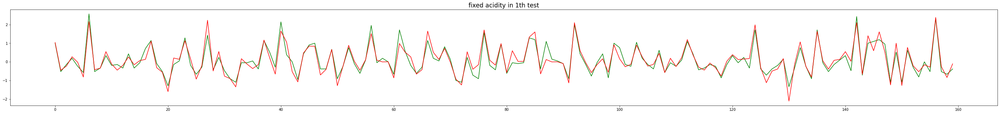

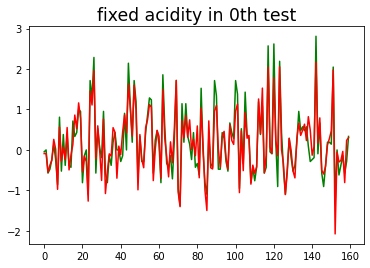

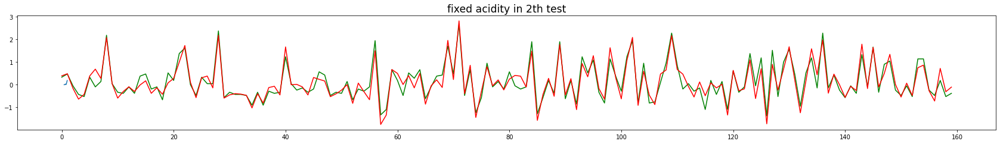

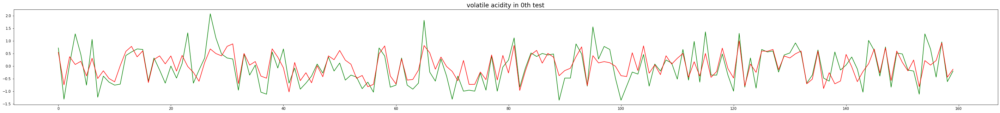

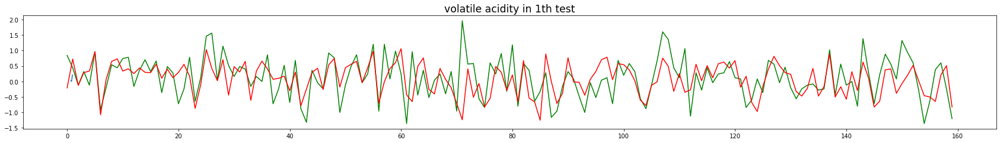

...

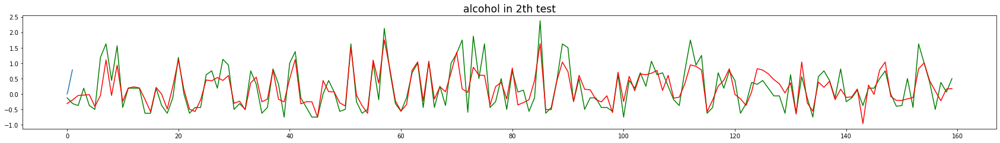

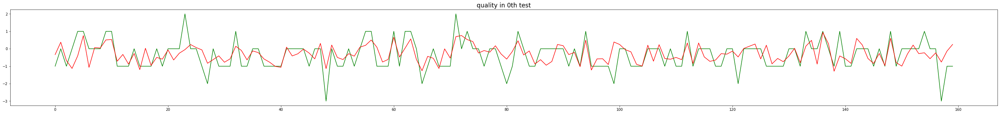

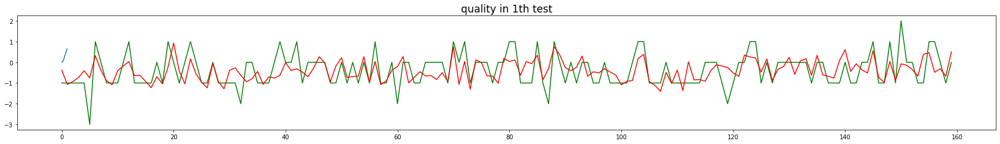

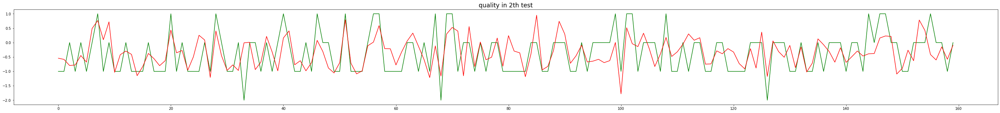

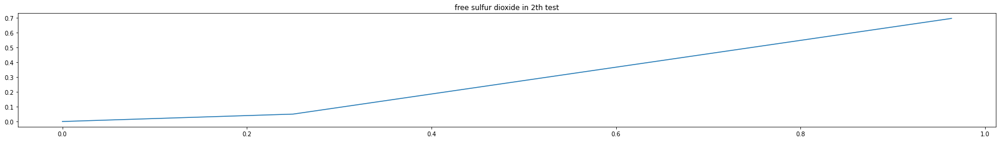

<Figure size 3600x360 with 0 Axes>

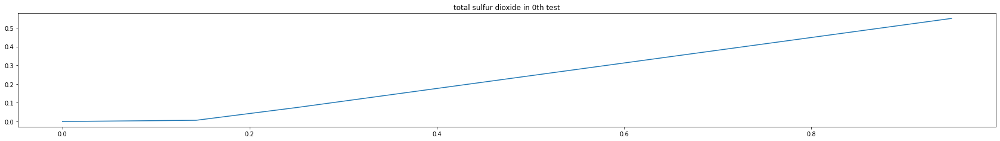

<Figure size 3600x360 with 0 Axes>

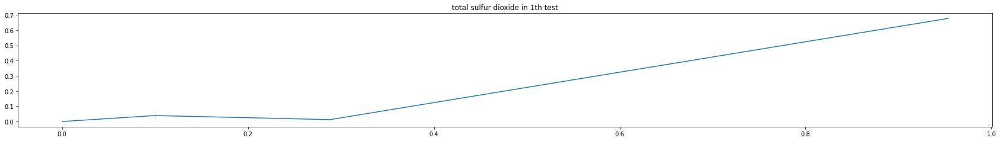

<Figure size 3600x360 with 0 Axes>

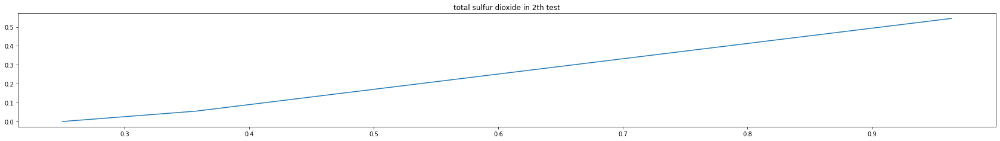

<Figure size 3600x360 with 0 Axes>

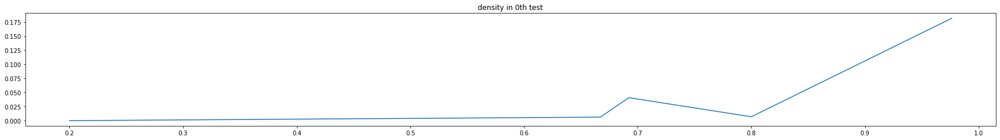

<Figure size 3600x360 with 0 Axes>

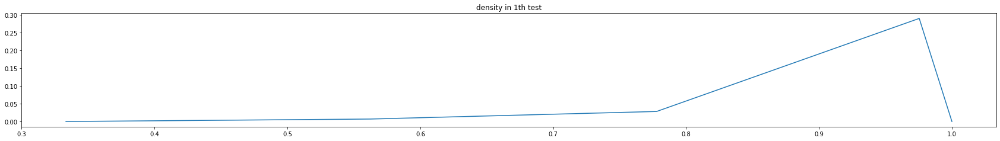

<Figure size 3600x360 with 0 Axes>

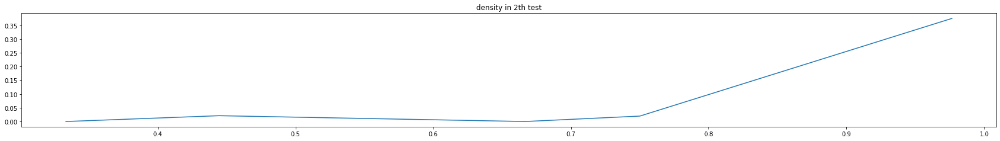

<Figure size 3600x360 with 0 Axes>

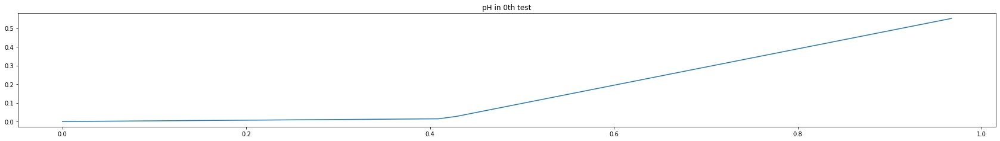

<Figure size 3600x360 with 0 Axes>

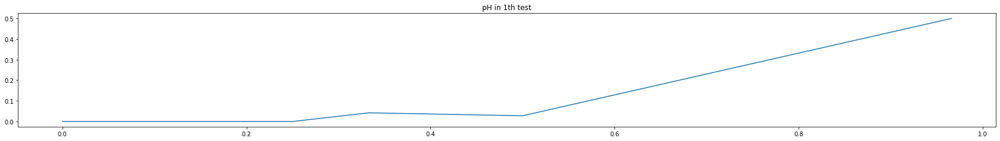

<Figure size 3600x360 with 0 Axes>

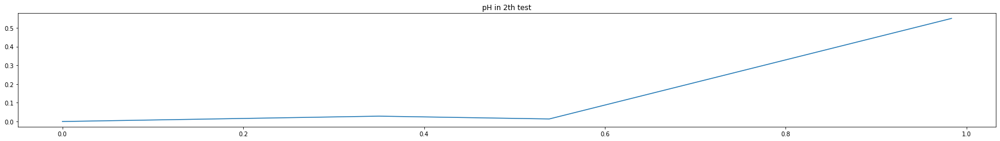

<Figure size 3600x360 with 0 Axes>

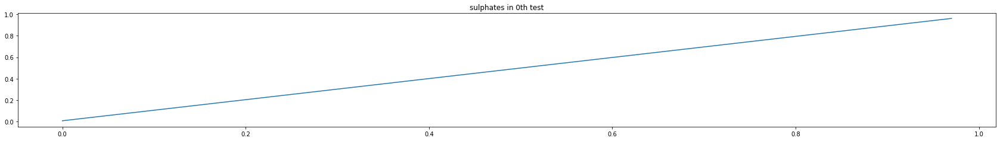

<Figure size 3600x360 with 0 Axes>

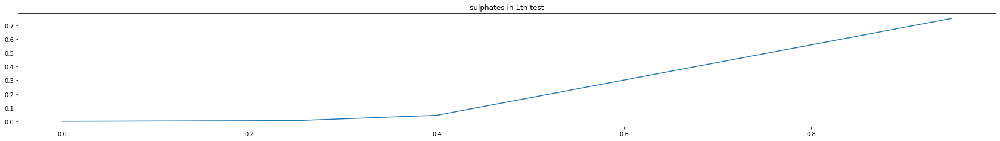

<Figure size 3600x360 with 0 Axes>

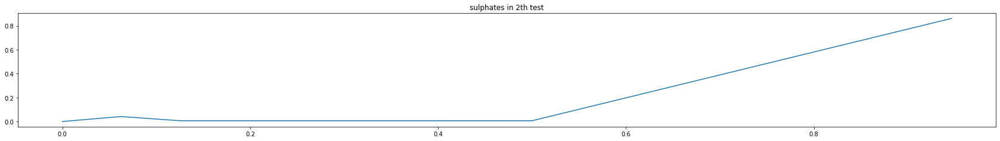

<Figure size 3600x360 with 0 Axes>

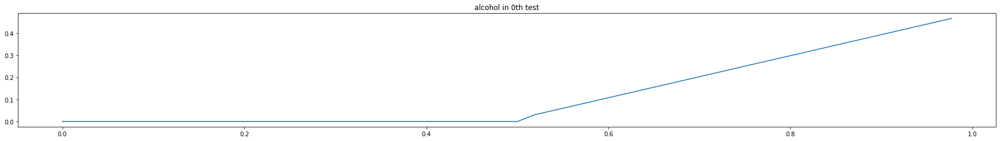

<Figure size 3600x360 with 0 Axes>

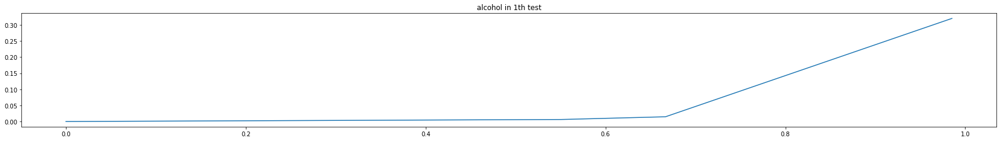

<Figure size 3600x360 with 0 Axes>

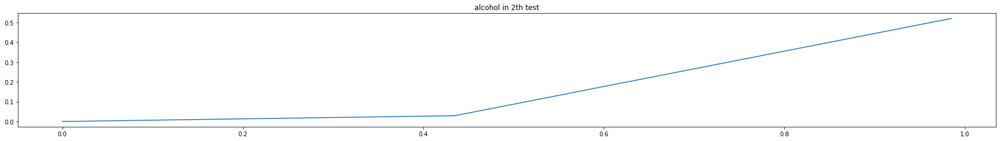

<Figure size 3600x360 with 0 Axes>

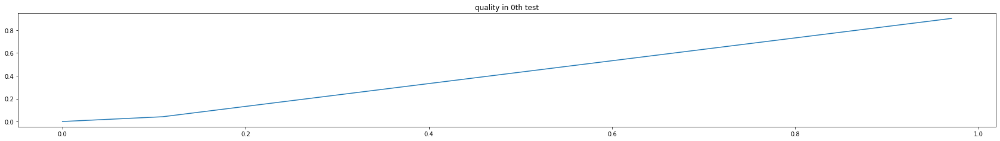

<Figure size 3600x360 with 0 Axes>

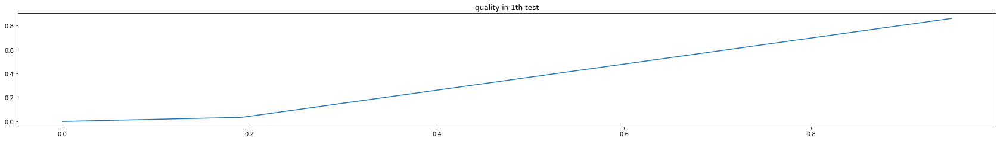

<Figure size 3600x360 with 0 Axes>

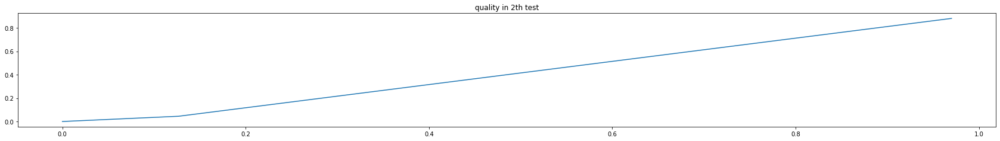

In [ ]:
all_label_target = opt_data.columns
len_target = len(all_label_target)
index = 0
k = 0
while index < len_target:
  # Get needed data
  [X_train, X_test, Y_train, Y_test] = needed_data(red_df, all_label_target[index], index)
  #Train
  j = 0
  while j < len(X_train):
    reg = LinearRegression().fit(X_train[j], Y_train[j])
    y_pred = reg.predict(X_test[j])
    rmse = math.sqrt(mean_squared_error(Y_test[j], y_pred))
    SD = KHOI_standard_deviation(Y_test[j], y_pred)
    acc = (r2_score(Y_test[j], y_pred) * 100)
    cmatrix = confusion_matrix(Y_test[j].astype(int), y_pred.astype(int))
    cal = re_cm(cmatrix)
    pra = reg.coef_
    print('\n')
    print("The Linear Regression Equation of {0} in {1}th test: \n{2}".format(all_label_target[index],j, Khoi_LE(pra)))
    print("The RMSE of {0} in {1}th test: {2}".format(all_label_target[index], j, rmse))
    print("The SD of {0} in {1}th test: {2}".format(all_label_target[index], j, SD))
    print("The Confusion matrix of {0} in {1}th test: \n{2}".format(all_label_target[index], j, cmatrix))
    print("The Accuracy is: {0} \nThe True positive rate is: {1} \nThe False Positive Rate is: {2} \nThe False Negative Rate is:{3} \nThe Precision is {4}\n".format(np.mean(cal[0]), np.mean(cal[1]), np.mean(cal[2]), np.mean(cal[3]), np.mean(cal[4])))
    print("The Mean Performance of {0} in {1}th test: {2}".format(all_label_target[index], j, mean([np.mean(cal[1]), np.mean(cal[2]), np.mean(cal[3]), np.mean(cal[4])])))
    print('\n')
    Khoi_Plot(Y_test[j], y_pred, k, "{0} in {1}th test".format(all_label_target[index], j))
    Khoi_ROC(cal[2], cal[1], j, "{0} in {1}th test".format(all_label_target[index], j))
    k += 1
    j += 1
  index += 1

# **Linear Regresstion for White Wine**

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide




The Linear Regression Equation of fixed acidity in 0th test: 
Y = [-0.05085445  0.06979265 -1.986865   -0.06299197 -0.00700686 -0.03005201
  2.78211885 -0.63692182 -0.12555724  1.28579005  0.03576389]X
The RMSE of fixed acidity in 0th test: 0.4663141312705114
The SD of fixed acidity in 0th test: 0.659469088215474
The Confusion matrix of fixed acidity in 0th test: 
[[ 24  26   0   0   0   0]
 [  7 357   5   0   0   0]
 [  0  44  16   0   0   0]
 [  0   1   7   1   0   0]
 [  0   0   0   1   0   0]
 [  0   0   0   1   0   0]]
The Accuracy is: 0.9374149659863944 
The True positive rate is: 0.3042095754290876 
The False Positive Rate is: 0.10579182188590223 
The False Negative Rate is:0.6957904245709123 
The Precision is 0.6282669006704279

The Mean Performance of fixed acidity in 0th test: 0.4335146806390825




The Linear Regression Equation of fixed acidity in 1th test: 
Y = [-0.04910227  0.07602194 -1.98091897 -0.06389319 -0.01122135 -0.02691006
  2.76607713 -0.64044533 -0.12042951  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide




The Linear Regression Equation of fixed acidity in 2th test: 
Y = [-0.0446312   0.06906495 -1.99909557 -0.06234543 -0.00598418 -0.03685942
  2.79530323 -0.64392498 -0.11812455  1.30075516  0.02984678]X
The RMSE of fixed acidity in 2th test: 0.4850882338045043
The SD of fixed acidity in 2th test: 0.6303861759831498
The Confusion matrix of fixed acidity in 2th test: 
[[  1   1   0   0   0   0]
 [  0  11  26   0   0   0]
 [  0   3 371   8   0   0]
 [  0   0  47  13   0   0]
 [  0   0   1   4   1   0]
 [  0   0   0   1   2   0]]
The Accuracy is: 0.9367346938775509 
The True positive rate is: 0.35863913651871765 
The False Positive Rate is: 0.12139666613412232 
The False Negative Rate is:0.6413608634812823 
The Precision is 0.6800749063670413

The Mean Performance of fixed acidity in 2th test: 0.4503678931252909




The Linear Regression Equation of volatile acidity in 0th test: 
Y = [-0.12986282 -0.15689357 -0.17578327  0.05760839 -0.26442791  0.33322634
  0.55279869 -0.14899734 -0.04748

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide




The Linear Regression Equation of volatile acidity in 1th test: 
Y = [-0.12801266 -0.1456475  -0.1284032   0.05660508 -0.25940579  0.35075028
  0.48775775 -0.14181757 -0.04768433  0.72137965 -0.24963977]X
The RMSE of volatile acidity in 1th test: 0.799644019928283
The SD of volatile acidity in 1th test: 0.3444393939606653
The Confusion matrix of volatile acidity in 1th test: 
[[  0  28   0   0   0   0]
 [  0 399   2   0   0   0]
 [  0  44   0   0   0   0]
 [  0   9   1   0   0   0]
 [  0   5   0   0   0   0]
 [  0   2   0   0   0   0]]
The Accuracy is: 0.938095238095238 
The True positive rate is: 0.1658354114713217 
The False Positive Rate is: 0.16591508372382055 
The False Negative Rate is:0.8341645885286783 
The Precision is 0.4096509240246407

The Mean Performance of volatile acidity in 1th test: 0.3938915019371153




The Linear Regression Equation of volatile acidity in 2th test: 
Y = [-0.11532851 -0.15635161 -0.09349638  0.0603114  -0.25525111  0.3263692
  0.44223418 -0.122624

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide




The Linear Regression Equation of citric acid in 0th test: 
Y = [ 0.22291947 -0.19624001 -0.25253484  0.07121992  0.0600351   0.08604709
  0.49462136 -0.14717164  0.05635078  0.37654909  0.00406942]X
The RMSE of citric acid in 0th test: 0.9926021550412333
The SD of citric acid in 0th test: 0.40541140633800904
The Confusion matrix of citric acid in 0th test: 
[[  0   1   5   0   0   0   0   0]
 [  0   1  33   0   0   0   0   0]
 [  0   0 355   4   0   0   0   0]
 [  0   0  63   3   0   0   0   0]
 [  0   0  14   0   0   0   0   0]
 [  0   0   7   0   0   0   0   0]
 [  0   0   1   0   0   0   0   0]
 [  0   0   3   0   0   0   0   0]]
The Accuracy is: 0.9331632653061225 
The True positive rate is: 0.13296553110988632 
The False Positive Rate is: 0.1216823757236242 
The False Negative Rate is:0.8670344688901137 
The Precision is 0.5555390555390556

The Mean Performance of citric acid in 0th test: 0.41930535781566997




The Linear Regression Equation of citric acid in 1th test: 
Y = [ 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until




The Linear Regression Equation of citric acid in 2th test: 
Y = [ 0.22626673 -0.19822903 -0.22872864  0.0683773   0.06548731  0.08545801
  0.48044467 -0.14949991  0.05948286  0.36481993  0.01214093]X
The RMSE of citric acid in 2th test: 0.9208903176911193
The SD of citric acid in 2th test: 0.3809712401483601
The Confusion matrix of citric acid in 2th test: 
[[  0   0   4   0   0   0   0]
 [  0   2  28   0   0   0   0]
 [  0   0 370   2   0   0   0]
 [  0   0  60   2   0   0   0]
 [  0   0  13   1   0   0   0]
 [  0   0   7   0   0   0   0]
 [  0   0   1   0   0   0   0]]
The Accuracy is: 0.9323615160349854 
The True positive rate is: 0.15622119815668203 
The False Positive Rate is: 0.13780520920549433 
The False Negative Rate is:0.843778801843318 
The Precision is 0.7220151828847481

The Mean Performance of citric acid in 2th test: 0.46495509802256063




The Linear Regression Equation of residual sugar in 0th test: 
Y = [-0.22259006 -0.00771186 -0.00885769 -0.02434786  0.05204122 -0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This i



The Linear Regression Equation of residual sugar in 1th test: 
Y = [-0.22270307 -0.00553712 -0.00638701 -0.02398286  0.0511965  -0.04355439
  1.25607005 -0.20598255 -0.06279867  0.54756425  0.03571691]X
The RMSE of residual sugar in 1th test: 0.14971736745798342
The SD of residual sugar in 1th test: 0.5540421437013505
The Confusion matrix of residual sugar in 1th test: 
[[426   3   0]
 [ 22  38   0]
 [  0   1   0]]
The Accuracy is: 0.964625850340136 
The True positive rate is: 0.542113442113442 
The False Positive Rate is: 0.12331935442877114 
The False Negative Rate is:0.45788655788655785 
The Precision is 0.9278273809523809

The Mean Performance of residual sugar in 1th test: 0.512786683845288




The Linear Regression Equation of residual sugar in 2th test: 
Y = [-0.22444114 -0.00406224 -0.00783838 -0.02370166  0.05122015 -0.04420428
  1.25687243 -0.20732865 -0.06155107  0.54891021  0.03559737]X
The RMSE of residual sugar in 2th test: 0.15975536824039913
The SD of residual sugar i

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This i



The Linear Regression Equation of chlorides in 1th test: 
Y = [-0.46609604  0.15838899  0.16499072 -1.55618902  0.07787377  0.04596818
  1.75482405 -0.42104656 -0.07385882 -0.03901936 -0.02289468]X
The RMSE of chlorides in 1th test: 1.3992680281538972
The SD of chlorides in 1th test: 0.6871612993030584
The Confusion matrix of chlorides in 1th test: 
[[  0   0   1   0   0   0   0   0   0   0   0   0   0   0]
 [  0   6  40   0   0   0   0   0   0   0   0   0   0   0]
 [  0   9 333  39   1   0   0   0   0   0   0   0   0   0]
 [  0   0  28  12   0   0   0   0   0   0   0   0   0   0]
 [  0   0   2   2   0   0   0   0   0   0   0   0   0   0]
 [  0   0   2   1   0   0   0   0   0   0   0   0   0   0]
 [  0   0   1   2   0   0   0   0   0   0   0   0   0   0]
 [  0   0   3   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   2   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   1   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   1   0   0   0   0   0   0   0   0   0   

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This i



The Linear Regression Equation of free sulfur dioxide in 0th test: 
Y = [-0.00795807 -0.11760774  0.02134772  0.52758759  0.01155633  0.67869467
 -0.62277214  0.04090063  0.00522608 -0.23901018  0.04388566]X
The RMSE of free sulfur dioxide in 0th test: 0.5407940785085742
The SD of free sulfur dioxide in 0th test: 0.4705866090923041
The Confusion matrix of free sulfur dioxide in 0th test: 
[[  6  19   0   0]
 [  2 407   3   0]
 [  0  44   3   0]
 [  0   5   1   0]]
The Accuracy is: 0.9244897959183673 
The True positive rate is: 0.32292346622598633 
The False Positive Rate is: 0.22128132310903736 
The False Negative Rate is:0.6770765337740137 
The Precision is 0.6784711779448621

The Mean Performance of free sulfur dioxide in 0th test: 0.4749381252634749




The Linear Regression Equation of free sulfur dioxide in 1th test: 
Y = [-0.01283699 -0.11382731  0.02193176  0.52095351  0.01221205  0.68374072
 -0.62615455  0.04615183  0.00385242 -0.25667782  0.05170928]X
The RMSE of free sulfur

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matp



The Linear Regression Equation of total sulfur dioxide in 1th test: 
Y = [-0.0231223   0.11560136  0.01887721 -0.33288075  0.00541443  0.51355804
  0.68830977 -0.00859193  0.04676172  0.07560457 -0.01164358]X
The RMSE of total sulfur dioxide in 1th test: 0.478621749665254
The SD of total sulfur dioxide in 1th test: 0.5062640670630061
The Confusion matrix of total sulfur dioxide in 1th test: 
[[  0   0   1   0]
 [  0   1  27   0]
 [  0   0 411   8]
 [  0   0  34   8]]
The Accuracy is: 0.9285714285714285 
The True positive rate is: 0.3017743493578816 
The False Positive Rate is: 0.2227741448692153 
The False Negative Rate is:0.6982256506421185 
The Precision is 0.7896405919661733

The Mean Performance of total sulfur dioxide in 1th test: 0.5031036842088472




The Linear Regression Equation of total sulfur dioxide in 2th test: 
Y = [-0.03234613  0.11083703  0.02289094 -0.34551685  0.00439417  0.51943795
  0.70612846 -0.01576927  0.0467499   0.07725887 -0.00806627]X
The RMSE of total su

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel



The Linear Regression Equation of density in 1th test: 
Y = [ 0.17430468  0.01178956  0.00809808  0.70404291  0.01515854 -0.03449119
  0.0504792   0.15218439  0.04647604 -0.47383358 -0.01937554]X
The RMSE of density in 1th test: 0.10076704649536994
The SD of density in 1th test: 0.6712642095482148
The Confusion matrix of density in 1th test: 
[[ 18   2   0]
 [  5 409   7]
 [  0   6  43]]
The Accuracy is: 0.9727891156462585 
The True positive rate is: 0.9163491524875984 
The False Positive Rate is: 0.04748444757695452 
The False Negative Rate is:0.08365084751240164 
The Precision is 0.8744746811246654

The Mean Performance of density in 1th test: 0.480489782175405




The Linear Regression Equation of density in 2th test: 
Y = [ 0.17591422  0.01077026  0.00922895  0.70452161  0.01496841 -0.03445304
  0.05063863  0.15331564  0.04555002 -0.47377412 -0.01947532]X
The RMSE of density in 2th test: 0.10912990714252274
The SD of density in 2th test: 0.6871652075932906
The Confusion matrix of

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 f



The Linear Regression Equation of pH in 1th test: 
Y = [-0.6828814  -0.05800186 -0.04507451 -1.95359335 -0.06154212  0.04301639
 -0.01066198  2.57506713 -0.0470627   1.23158929  0.0609802 ]X
The RMSE of pH in 1th test: 0.5105030067392146
The SD of pH in 1th test: 0.5191278025128955
The Confusion matrix of pH in 1th test: 
[[  0   0   1   0   0   0]
 [  0   6  44   0   0   0]
 [  0   3 373   3   0   0]
 [  0   0  46   9   0   0]
 [  0   0   0   4   0   0]
 [  0   0   0   0   1   0]]
The Accuracy is: 0.9306122448979591 
The True positive rate is: 0.21130087151195331 
The False Positive Rate is: 0.14079792813828573 
The False Negative Rate is:0.7886991284880467 
The Precision is 0.5082614942528735

The Mean Performance of pH in 1th test: 0.4122648555977898




The Linear Regression Equation of pH in 2th test: 
Y = [-0.68721864 -0.0506451  -0.04870097 -1.97083411 -0.06199449  0.04643307
 -0.01917774  2.60000443 -0.04408779  1.2460467   0.06525133]X
The RMSE of pH in 2th test: 0.532733161

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 f



The Linear Regression Equation of sulphates in 0th test: 
Y = [-0.26453218 -0.03917663  0.0371705  -1.21374793 -0.02004546  0.00969457
  0.11290134  1.61955331 -0.10095939  0.74785765  0.10181117]X
The RMSE of sulphates in 0th test: 0.8260456923018953
The SD of sulphates in 0th test: 0.2642370556351714
The Confusion matrix of sulphates in 0th test: 
[[  0  22   0   0   0]
 [  0 401   1   0   0]
 [  0  48   0   0   0]
 [  0  15   0   0   0]
 [  0   3   0   0   0]]
The Accuracy is: 0.9273469387755101 
The True positive rate is: 0.19950248756218905 
The False Positive Rate is: 0.20045248868778281 
The False Negative Rate is:0.800497512437811 
The Precision is 0.41002044989775055

The Mean Performance of sulphates in 0th test: 0.40261823464638336




The Linear Regression Equation of sulphates in 1th test: 
Y = [-0.26413428 -0.04011587  0.03693591 -1.22513177 -0.02220616  0.00738596
  0.11936199  1.61761886 -0.09680672  0.76181781  0.08963046]X
The RMSE of sulphates in 1th test: 0.677874

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This i



The Linear Regression Equation of sulphates in 2th test: 
Y = [-0.25436336 -0.03583135  0.03909698 -1.1805411  -0.01693245  0.00165862
  0.11471527  1.55858661 -0.08895555  0.72121751  0.09149955]X
The RMSE of sulphates in 2th test: 0.7812415935570274
The SD of sulphates in 2th test: 0.2718655716352874
The Confusion matrix of sulphates in 2th test: 
[[  0  15   0   0   0]
 [  0 397   0   0   0]
 [  0  58   2   0   0]
 [  0  14   0   0   0]
 [  0   4   0   0   0]]
The Accuracy is: 0.9257142857142858 
The True positive rate is: 0.2066666666666667 
The False Positive Rate is: 0.1956989247311828 
The False Negative Rate is:0.7933333333333333 
The Precision is 0.9067622950819672

The Mean Performance of sulphates in 2th test: 0.5256153049532875




The Linear Regression Equation of alcohol in 0th test: 
Y = [ 0.26544967  0.05983257  0.02433859  1.00329881 -0.00179683 -0.04344542
  0.01495863 -1.55213307  0.23704689  0.07328149  0.03669975]X
The RMSE of alcohol in 0th test: 0.1923992377602

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matp



The Linear Regression Equation of alcohol in 1th test: 
Y = [ 2.65051835e-01  5.72195059e-02  2.16070166e-02  1.00718012e+00
 -1.10609091e-03 -4.63982648e-02  1.81954742e-02 -1.55493635e+00
  2.38854941e-01  7.18275106e-02  3.62377705e-02]X
The RMSE of alcohol in 1th test: 0.18671522392039008
The SD of alcohol in 1th test: 0.600421521077972
The Confusion matrix of alcohol in 1th test: 
[[  0   1   0]
 [  3 424   0]
 [  0  23  39]]
The Accuracy is: 0.963265306122449 
The True positive rate is: 0.5406688323134649 
The False Positive Rate is: 0.1290291167591781 
The False Negative Rate is:0.4593311676865352 
The Precision is 0.6488095238095238

The Mean Performance of alcohol in 1th test: 0.4444596601421755




The Linear Regression Equation of alcohol in 2th test: 
Y = [ 0.269242    0.05472335  0.02304957  1.011998   -0.00177421 -0.04438742
  0.01822308 -1.55828381  0.24166954  0.06932648  0.03545262]X
The RMSE of alcohol in 2th test: 0.1986755408577413
The SD of alcohol in 2th test: 0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This i



The Linear Regression Equation of quality in 1th test: 
Y = [ 0.06391677 -0.19983208 -0.00276914  0.66300543 -0.00654962  0.09433071
 -0.02827959 -0.64166996  0.11935164  0.08528379  0.3657065 ]X
The RMSE of quality in 1th test: 0.7493475793450397
The SD of quality in 1th test: 0.47701305736237365
The Confusion matrix of quality in 1th test: 
[[  0   0   0   1   0   0   0]
 [  0   0   3   9   0   0   0]
 [  0   0   8 144   0   0   0]
 [  0   0   2 203   0   0   0]
 [  0   0   0  96   1   0   0]
 [  0   0   0  21   0   0   0]
 [  0   0   0   2   0   0   0]]
The Accuracy is: 0.8379008746355685 
The True positive rate is: 0.15045496567670116 
The False Positive Rate is: 0.13895537660719845 
The False Negative Rate is:0.8495450343232989 
The Precision is 0.6806184012066365

The Mean Performance of quality in 1th test: 0.45489344445345875




The Linear Regression Equation of quality in 2th test: 
Y = [ 0.06308118 -0.20888937  0.00783234  0.67011809 -0.00431742  0.07674474
 -0.0194268  -0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This i

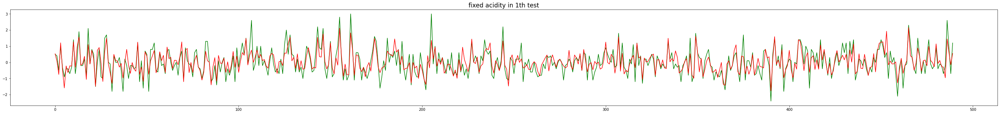

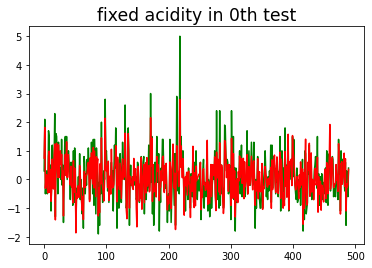

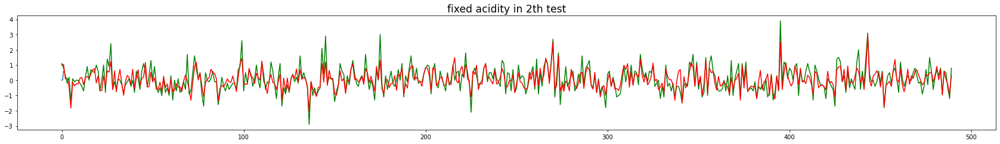

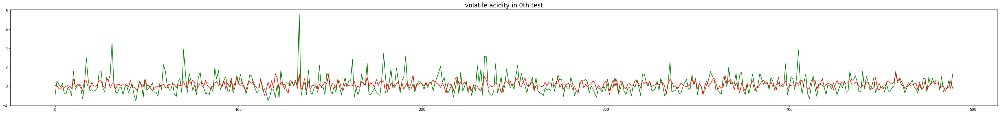

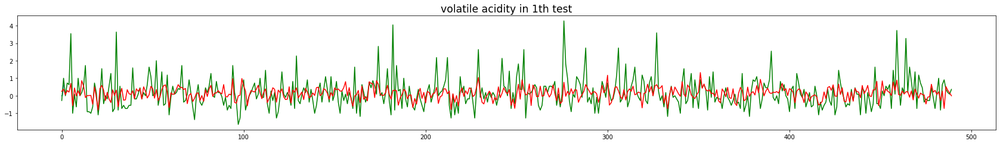

...

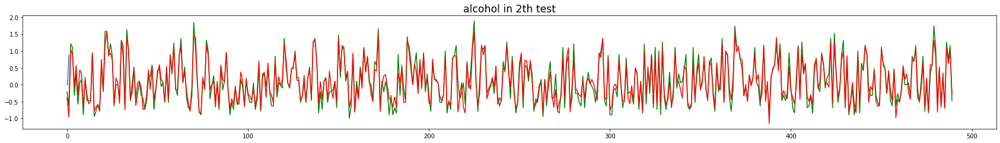

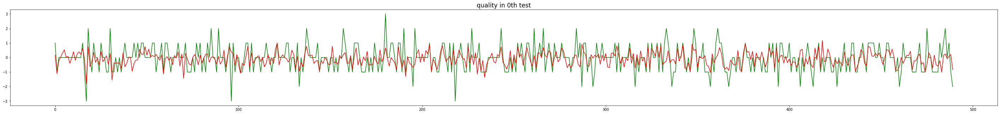

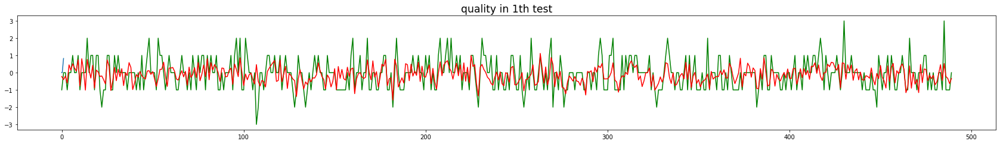

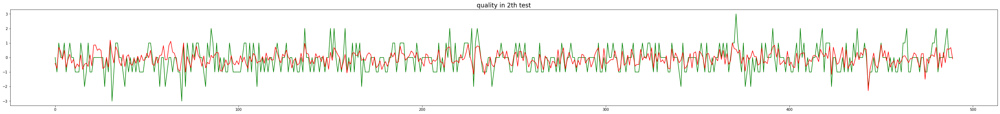

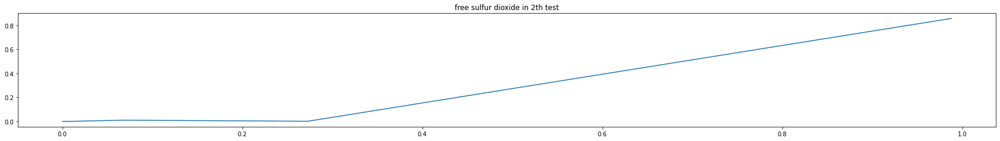

<Figure size 3600x360 with 0 Axes>

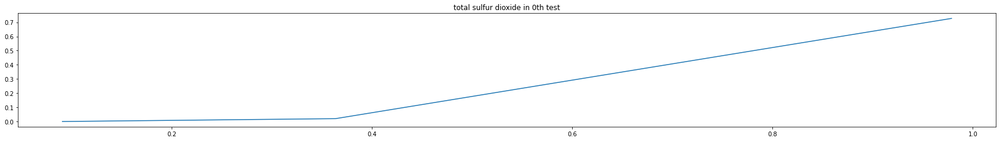

<Figure size 3600x360 with 0 Axes>

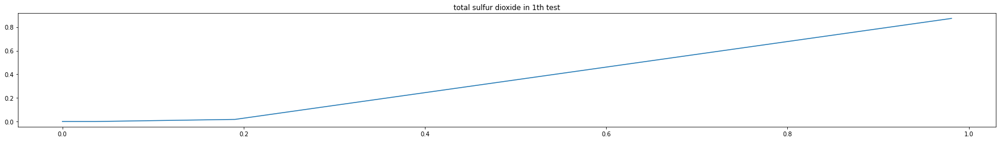

<Figure size 3600x360 with 0 Axes>

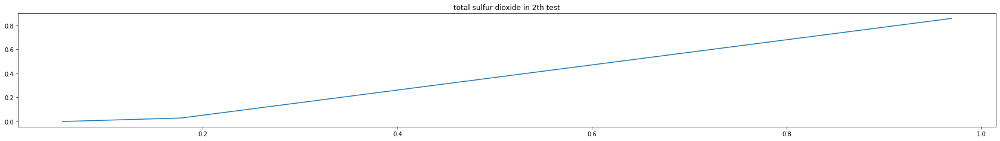

<Figure size 3600x360 with 0 Axes>

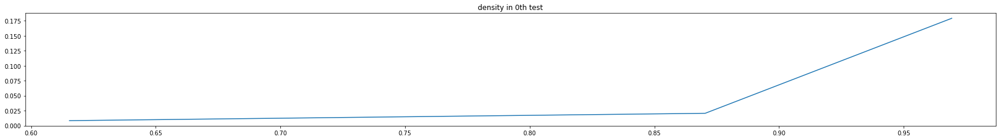

<Figure size 3600x360 with 0 Axes>

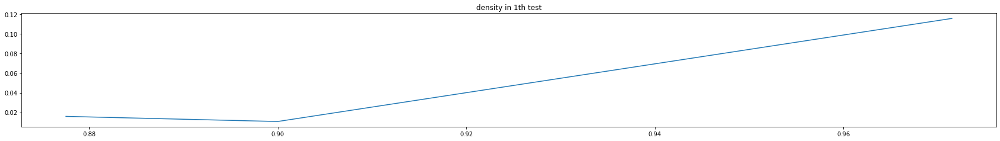

<Figure size 3600x360 with 0 Axes>

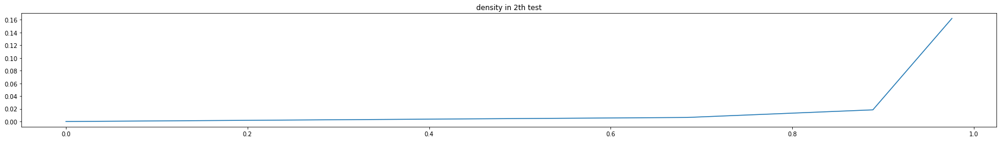

<Figure size 3600x360 with 0 Axes>

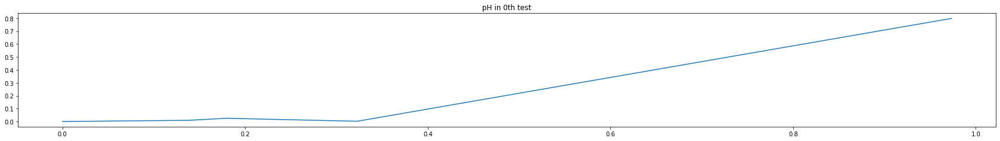

<Figure size 3600x360 with 0 Axes>

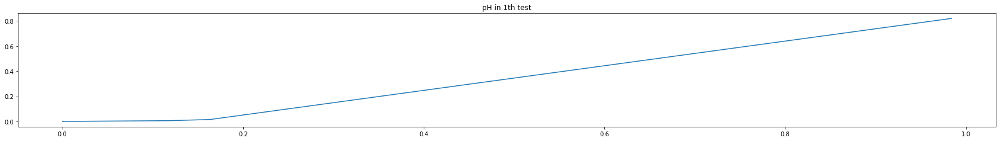

<Figure size 3600x360 with 0 Axes>

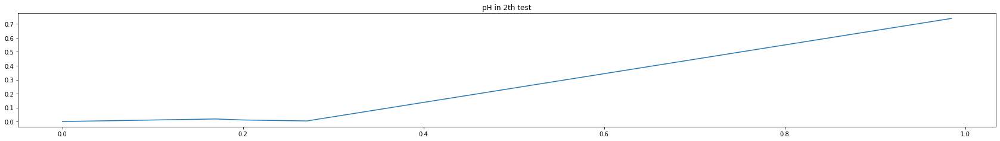

<Figure size 3600x360 with 0 Axes>

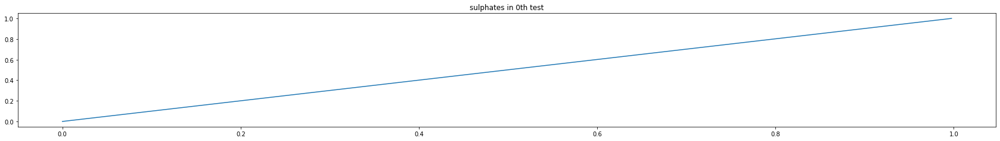

<Figure size 3600x360 with 0 Axes>

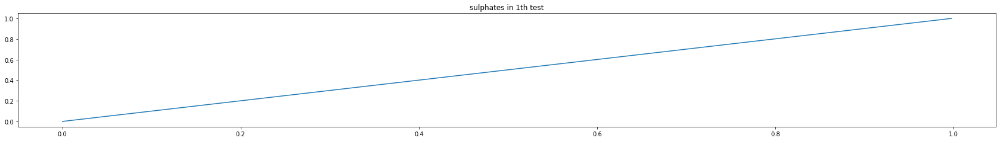

<Figure size 3600x360 with 0 Axes>

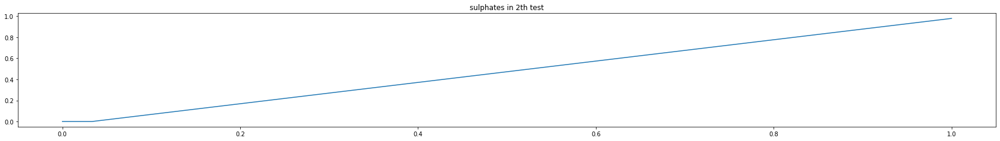

<Figure size 3600x360 with 0 Axes>

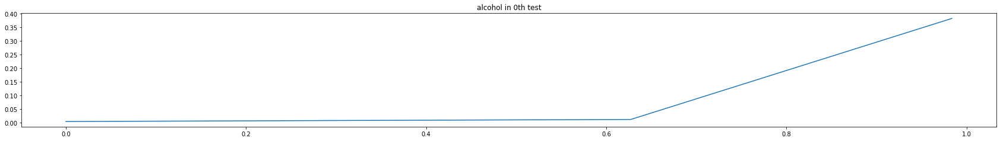

<Figure size 3600x360 with 0 Axes>

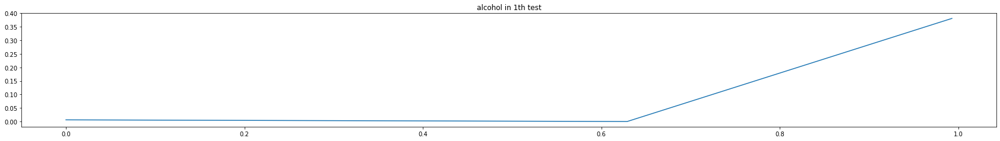

<Figure size 3600x360 with 0 Axes>

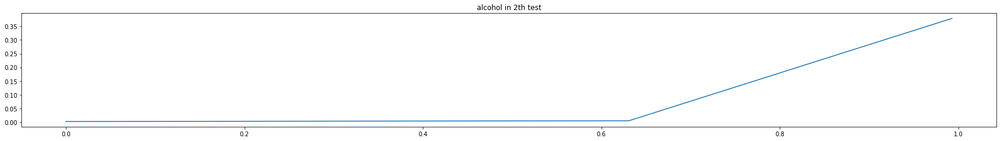

<Figure size 3600x360 with 0 Axes>

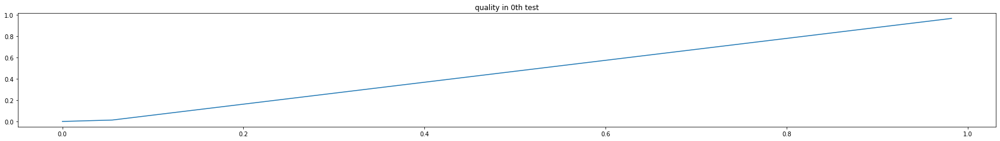

<Figure size 3600x360 with 0 Axes>

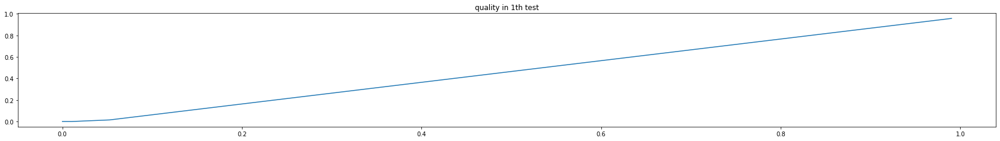

<Figure size 3600x360 with 0 Axes>

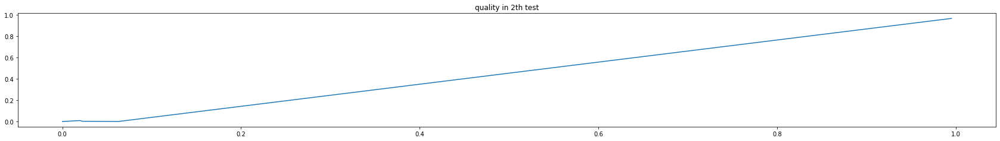

In [ ]:
all_label_target = opt_data.columns
len_target = len(all_label_target)
index = 0
k = 0
while index < len_target:
  # Get needed data
  [X_train, X_test, Y_train, Y_test] = needed_data(white_df, all_label_target[index], index)
  #Train
  j = 0
  while j < len(X_train):
    reg = LinearRegression().fit(X_train[j], Y_train[j])
    y_pred = reg.predict(X_test[j])
    rmse = math.sqrt(mean_squared_error(Y_test[j], y_pred))
    SD = KHOI_standard_deviation(Y_test[j], y_pred)
    acc = (r2_score(Y_test[j], y_pred) * 100)
    cmatrix = confusion_matrix(Y_test[j].astype(int), y_pred.astype(int))
    cal = re_cm(cmatrix)
    pra = reg.coef_
    print('\n')
    print("The Linear Regression Equation of {0} in {1}th test: \n{2}".format(all_label_target[index],j, Khoi_LE(pra)))
    print("The RMSE of {0} in {1}th test: {2}".format(all_label_target[index], j, rmse))
    print("The SD of {0} in {1}th test: {2}".format(all_label_target[index], j, SD))
    print("The Confusion matrix of {0} in {1}th test: \n{2}".format(all_label_target[index], j, cmatrix))
    print("The Accuracy is: {0} \nThe True positive rate is: {1} \nThe False Positive Rate is: {2} \nThe False Negative Rate is:{3} \nThe Precision is {4}\n".format(np.mean(cal[0]), np.mean(cal[1]), np.mean(cal[2]), np.mean(cal[3]), np.mean(cal[4])))
    print("The Mean Performance of {0} in {1}th test: {2}".format(all_label_target[index], j, mean([np.mean(cal[1]), np.mean(cal[2]), np.mean(cal[3]), np.mean(cal[4])])))
    print('\n')
    Khoi_Plot(Y_test[j], y_pred, k, "{0} in {1}th test".format(all_label_target[index], j))
    Khoi_ROC(cal[2], cal[1], j, "{0} in {1}th test".format(all_label_target[index], j))
    k += 1
    j += 1
  index += 1